In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os 
import sys

projRootPath =  os.path.abspath(os.path.join('.' ,"../.."))
print("Project root path is: ", projRootPath)
sys.path.append(projRootPath)

from src.utils.path_manipulation import contains_filetype
from src.utils.viz_functions import make_mel_spectrogram
from src.utils.sound_functions import mix_samples, read_mp3, write_mp3, pad_length_to_max

# modules for visuals
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

# modules for data processing
import numpy as np
from scipy import signal
from scipy.io import wavfile
import wave
import struct
import csv
import random
from sklearn.preprocessing import StandardScaler

# modules for data mining
from sklearn.decomposition import pca, FastICA

# and IPython.display for audio output
from tqdm.notebook import tqdm 
import IPython.display

# Librosa for audio
import librosa
# And the display module for visualization
import librosa.display

from pydub import AudioSegment

Project root path is:  D:\Programming\AudioMining


In [3]:
# Get data files
dataDirName = "data"
# rawDataDirName = os.path.join("raw", "mp3")
rawDataDirName = "converted_wav"
className1 = "violin"
className2 = "guitar"
data_path1 = os.path.join(projRootPath, dataDirName, rawDataDirName, className1)
data_path2 = os.path.join(projRootPath, dataDirName, rawDataDirName, className2)

# Get all files from data_path 
# r=root, d=directories, f = files
file_extension = ".wav"
(_, d, allFiles) = next(os.walk(data_path1))
soundFiles1 = [f for f in allFiles if f.endswith(file_extension)]

(_, d, allFiles) = next(os.walk(data_path2))
soundFiles2 = [f for f in allFiles if f.endswith(file_extension)]

In [4]:
# Get data files
dataDirName = "data"
# rawDataDirName = os.path.join("raw", "mp3")
rawDataDirName = "converted_wav"
className1 = "violin"
className2 = "guitar"
data_path1 = os.path.join(projRootPath, dataDirName, rawDataDirName, className1)
data_path2 = os.path.join(projRootPath, dataDirName, rawDataDirName, className2)

# Get all files from data_path 
# r=root, d=directories, f = files
file_extension = ".wav"
(_, d, allFiles) = next(os.walk(data_path1))
soundFiles1 = [f for f in allFiles if f.endswith(file_extension)]

(_, d, allFiles) = next(os.walk(data_path2))
soundFiles2 = [f for f in allFiles if f.endswith(file_extension)]

In [5]:
sdata1 = []
sampleRates1 = []
soundFiles = soundFiles1
for indx, file in tqdm(enumerate(soundFiles)):
    fpath = os.path.join(data_path1, file)
#     soundSample, fs = read_mp3(fpath)
    fs, soundSample = wavfile.read(fpath)
    sdata1.append(soundSample)
    sampleRates1.append(fs)
        

In [6]:
sdata2 = []
sampleRates2 = []
soundFiles = soundFiles2
for indx, file in tqdm(enumerate(soundFiles)):
    fpath = os.path.join(data_path2, file)
#     soundSample, fs = read_mp3(fpath)
    fs, soundSample = wavfile.read(fpath)
    sdata2.append(soundSample)
    sampleRates2.append(fs)

print(sdata2[:3])


[array([0, 0, 0, ..., 0, 0, 0], dtype=int16), array([0, 0, 0, ..., 0, 0, 0], dtype=int16), array([0, 0, 0, ..., 0, 0, 0], dtype=int16)]


In [7]:
### Check that sampling rate is the same
print(min(sampleRates1) == max(sampleRates1))
print(min(sampleRates2) == max(sampleRates2))

True
True


In [8]:
## Select only the samples shorter than threshold
lenThreshold = 300000
sdata1 = [x for x in sdata1 if len(x) <= lenThreshold]
sdata2 = [x for x in sdata2 if len(x) <= lenThreshold]

# random.shuffle(sdata1)
# random.shuffle(sdata2)

## Pad the length of the samples for matrix building
sdata1 = pad_length_to_max(sdata1, lenThreshold)
sdata2 = pad_length_to_max(sdata2, lenThreshold)

# trainset1 = sdata1[:50]
# trainset2 = sdata2[:50]

# valset1 = sdata1[50:100]
# valset2 = sdata2[50:]

# subset1 = random.sample(sdata1, 50)
# subset2 = random.sample(sdata2, 50)




In [9]:
def generate_mixtures(s1, s2, mixing_matrix):
    S = np.c_[s1, s2]
    S = StandardScaler().fit_transform(S)
    A = np.array(mixing_matrix)
    X = np.dot(S, A.T)
    return S, X
    

## Experiment 1:
Try to make ICA with only two sources and two observations

#### Using ica with 2 samples 

c:\users\marius\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


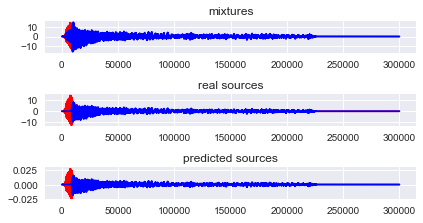

[[549.41987434 535.8480713 ]
 [276.53592106 815.64354944]]


In [10]:
s1 = sdata1[0]
s2 = sdata2[0]

mixt_mtx = [[1, 1], [0.5, 1.5]]
S, mixts = generate_mixtures(s1, s2, mixt_mtx)

# print(mixts.shape)

ica = FastICA(n_components=2)
S_recov = ica.fit_transform(mixts) # Reconstruct signals
estimated_mix_mtx = ica.mixing_  # Get estimated mixing matrix

fig = plt.figure()
models = [mixts, S, S_recov]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']
for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()

print(estimated_mix_mtx)

In [11]:
IPython.display.Audio(S[:, 0], rate=sampleRates1[2])

In [12]:
IPython.display.Audio(S_recov[:, 0], rate=sampleRates1[2])

In [13]:
IPython.display.Audio(S[:, 1], rate=sampleRates1[2])

In [14]:
IPython.display.Audio(S_recov[:, 1], rate=sampleRates1[2])

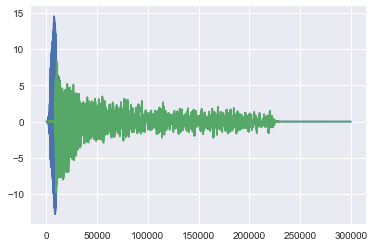

In [15]:
plt.plot(S)

#### Get another mixture and try for the same mixing matrix

In [39]:
s1_v = sdata1[5]
s2_v = sdata2[5]

mixt_mtx_v = [[1, 1], [0.5, 1.5]]
S_v, mixts_v = generate_mixtures(s1_v, s2_v, mixt_mtx_v)
new_mixtures = np.asarray(mixts_v)

c:\users\marius\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [40]:
# print(mixts.shape)

ica = FastICA(n_components=2)
S_recov_v = ica.fit_transform(new_mixtures) # Reconstruct signals
A_recov_v = ica.mixing_  # Get estimated mixing matrix


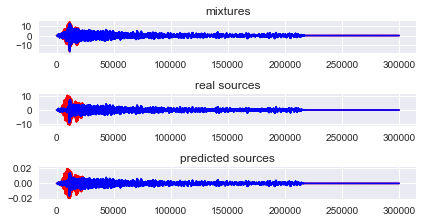

In [41]:
fig = plt.figure()
models = [mixts_v, S_v, S_recov_v]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']
for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()


In [42]:
IPython.display.Audio(S_v[:, 0], rate=sampleRates1[2])

In [43]:
IPython.display.Audio(S_recov_v[:, 0], rate=sampleRates1[2])

In [44]:
IPython.display.Audio(S_v[:, 1], rate=sampleRates1[2])

In [45]:
# This signal is still mixed
IPython.display.Audio(S_recov_v[:, 1], rate=sampleRates1[2])

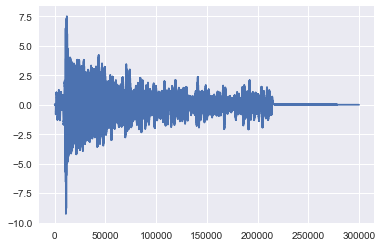

In [23]:
plt.plot(S_v[:, 1])

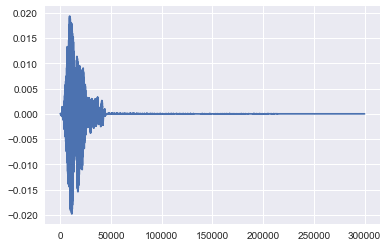

In [24]:
# This recovered signal is still mixed
plt.plot(S_recov_v[:, 1])

#### Try with 3 mixtures

In [46]:
s1_v = sdata1[5]
s2_v = sdata2[5]

mixt_mtx_v = [[1, 1], [0.5, 1.5], [0.3, 0.6]]
S_v, mixts_v = generate_mixtures(s1_v, s2_v, mixt_mtx_v)
new_mixtures = np.asarray(mixts_v)

c:\users\marius\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


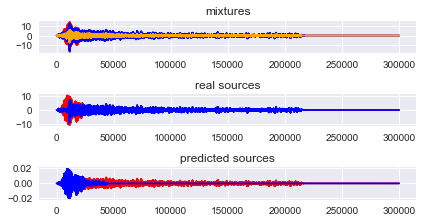

In [52]:
# print(mixts.shape)

ica = FastICA(n_components=2)
S_recov_v = ica.fit_transform(new_mixtures) # Reconstruct signals
A_recov_v = ica.mixing_  # Get estimated mixing matrix

fig = plt.figure()
models = [mixts_v, S_v, S_recov_v]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']
for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()


In [48]:
IPython.display.Audio(S_v[:, 0], rate=sampleRates1[2])

In [49]:
IPython.display.Audio(S_recov_v[:, 0], rate=sampleRates1[2])

In [50]:
IPython.display.Audio(S_v[:, 1], rate=sampleRates1[2])

In [51]:
# Now this signal seems pure
IPython.display.Audio(S_recov_v[:, 1], rate=sampleRates1[2])

## Now try the previous mixing matrix with new samples

In [31]:
s1_v = sdata1[10]
s2_v = sdata2[10]

mixt_mtx_v = [[1, 1], [0.5, 1.5], [0.3, 0.6]]
S_v_orig, mixts_v = generate_mixtures(s1_v, s2_v, mixt_mtx_v)
new_mixtures = np.asarray(mixts_v)


c:\users\marius\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [32]:
print(S_v_orig.shape)
print(A_recov_v.shape)
print(new_mixtures.shape)

# So mixing equation is S * A.T = mix
# To get approximate S_ we can do mix * pinv(A.T)

(300000, 2)
(3, 2)
(300000, 3)


In [33]:
# print(mixts.shape)

# ica = FastICA(n_components=2)
# S_recov_v = ica.fit_transform(new_mixtures) # Reconstruct signals
# A_recov_v_other = ica.mixing_  # Get estimated mixing matrix

# WE try to use the previous mixing matrix, which is a sort of model of the environment
S_recov_estimated = np.dot(new_mixtures, np.linalg.pinv(A_recov_v.T))


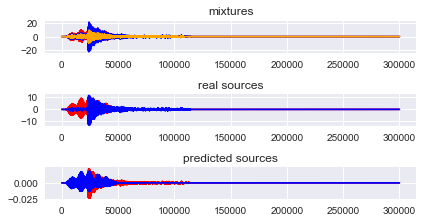

In [34]:
fig = plt.figure()
models = [new_mixtures, S_v_orig, S_recov_estimated]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']
for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()


In [35]:
IPython.display.Audio(S_v_orig[:, 0], rate=sampleRates1[2])

In [36]:
IPython.display.Audio(S_recov_estimated[:, 0], rate=sampleRates1[2])

In [37]:
IPython.display.Audio(S_v_orig[:, 1], rate=sampleRates1[2])

In [38]:
# Still mixed
IPython.display.Audio(S_recov_estimated[:, 1], rate=sampleRates1[2])

### Trying decomposition with only one observation

In [75]:
s1_s = sdata1[12]
s2_s = sdata2[12]

mixt_mtx_v = [[0.5, 0.8]]
S_single, mixts_single = generate_mixtures(s1_s, s2_s, mixt_mtx_v)



c:\users\marius\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [76]:
mixts_single.T

array([[-7.12012584e-05, -7.12012584e-05, -7.12012584e-05, ...,
        -7.12012584e-05, -7.12012584e-05, -7.12012584e-05]])

In [77]:
mixts_single = np.tile(np.array(mixts_single), (1, 3))
new_mixtures = np.asarray(mixts_single)
print(new_mixtures.shape)

(300000, 3)


In [ ]:

print(S_single.shape)
print(A_recov_v.shape)
print(new_mixtures.shape)

# So mixing equation is S * A.T = mix
# To get approximate S_ we can do mix * pinv(A.T)

# print(mixts.shape)

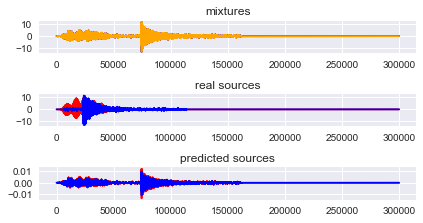

In [78]:
# ica = FastICA(n_components=2)
# S_recov_v = ica.fit_transform(new_mixtures) # Reconstruct signals
# A_recov_v_other = ica.mixing_  # Get estimated mixing matrix

# WE try to use the previous mixing matrix, which is a sort of model of the environment
S_recov_estimated = np.dot(new_mixtures, np.linalg.pinv(A_recov_v.T))


fig = plt.figure()
models = [new_mixtures, S_v_orig, S_recov_estimated]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']
for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()

In [79]:
IPython.display.Audio(mixts_single[:, 0], rate=sampleRates1[2])


In [80]:
IPython.display.Audio(S_single[:, 0], rate=sampleRates1[2])


In [81]:
IPython.display.Audio(S_recov_estimated[:, 0], rate=sampleRates1[2])


In [82]:
IPython.display.Audio(S_single[:, 1], rate=sampleRates1[2])


In [83]:
IPython.display.Audio(S_recov_estimated[:, 1], rate=sampleRates1[2])

#### Use a mixing matrix with a vector that is closer to those in the model

#### Make more complex model

### Study MSE in relation with number of observations for ICA